# Groundwater discharge

In this tutorial we will simulate a fictitious radioactive tracer that is injected into the ocean by groundwater discharge.
The 200 major rivers dataset from [*Luijendijk et al.* (2020)](https://www.nature.com/articles/s41467-020-15064-8) is available from within the AIBECS.
Once "born", our ficitious tracer decays with a parameter timescale $\tau$ as it flows through ocean basins.

The 3D tracer equation is:

$$\left[\frac{\partial}{\partial t} + \nabla \cdot (\boldsymbol{u} + \mathbf{K}\nabla)\right] x = s_\mathsf{gw} - x / \tau$$

where $\nabla \cdot \left[ \boldsymbol{u} - \mathbf{K} \nabla \right]$ represents the ocean circulation transport.
(Tracer transport operators are described in the documentation.)
The riverine source of the tracer is $s_\mathsf{gw}$, and $x / \tau$ is the decay rate.

In AIBECS, we must recast this equation in the generic form

$$\left[\frac{\partial}{\partial t} + \mathbf{T}(\boldsymbol{p})\right] \boldsymbol{x} = \boldsymbol{G}(\boldsymbol{x},\boldsymbol{p}).$$

We start by telling Julia that we want to use the AIBECS and the OCIM2 transport matrix for the ocean circulation.

In [1]:
using AIBECS
grd, T_OCIM2 = OCIM2.load()

┌ Warning: Over-writing registration of the datadep
│   name = AIBECS-OCIM2_CTL_He
└ @ DataDeps /Users/runner/.julia/packages/DataDeps/gbyoa/src/registration.jl:15
┌ Info: You are about to use the OCIM2_CTL_He model.
│ If you use it for research, please cite:
│ 
│ - DeVries, T., & Holzer, M. (2019). Radiocarbon and helium isotope constraints on deep ocean ventilation and mantle‐³He sources. Journal of Geophysical Research: Oceans, 124, 3036–3057. https://doi.org/10.1029/2018JC014716
│ 
│ You can find the corresponding BibTeX entries in the CITATION.bib file
│ at the root of the AIBECS.jl package repository.
│ (Look for the "DeVries_Holzer_2019" key.)
└ @ AIBECS.OCIM2 /Users/runner/work/AIBECS.jl/AIBECS.jl/src/OCIM2.jl:113


(, 
  [1     ,      1]  =  0.000197784
  [2     ,      1]  =  2.34279e-9
  [10384 ,      1]  =  -1.95995e-7
  [10442 ,      1]  =  -0.000191612
  [10443 ,      1]  =  4.80961e-9
  [20825 ,      1]  =  -1.83059e-9
  [20883 ,      1]  =  5.00768e-9
  [1     ,      2]  =  -5.02516e-8
  [2     ,      2]  =  0.000187531
  ⋮
  [200160, 200159]  =  -2.19656e-8
  [197886, 200160]  =  1.08199e-10
  [199766, 200160]  =  6.70981e-9
  [199777, 200160]  =  -1.26352e-9
  [199778, 200160]  =  -3.39279e-9
  [199779, 200160]  =  7.59316e-9
  [199790, 200160]  =  -7.41018e-9
  [200156, 200160]  =  -3.44106e-8
  [200159, 200160]  =  -2.00303e-8
  [200160, 200160]  =  5.27945e-8, Quantity{Float64,𝐍 𝐋⁻³ 𝐓⁻¹,Unitful.FreeUnits{(m⁻³, mol, yr⁻¹),𝐍 𝐋⁻³ 𝐓⁻¹,nothing}}[1.82368935574118e-11 mol m⁻³ yr⁻¹, 1.9469772194929453e-11 mol m⁻³ yr⁻¹, 3.4879359939844136e-13 mol m⁻³ yr⁻¹, 1.5360041759458074e-12 mol m⁻³ yr⁻¹, 1.47673234957578e-12 mol m⁻³ yr⁻¹, 5.300237184679614e-11 mol m⁻³ yr⁻¹, 8.595855761423191e-11 mol m⁻³ yr

The transport is

In [2]:
T_gw(p) = T_OCIM2

T_gw (generic function with 1 method)

For the radioactive decay, we simply use

In [3]:
function decay(x, p)
    @unpack τ = p
    return x / τ
end

decay (generic function with 1 method)

To build the river sources, we will load the geographic locations and discharge of groundwater (in m³ yr⁻¹) from the *Luijendijk et al.* (2020)) dataset.

In [4]:
gws = GroundWaters.load()

Archive:  /Users/runner/.julia/datadeps/groundwater_discharge/41467_2020_15064_MOESM8_ESM.zip
   creating: /Users/runner/.julia/datadeps/groundwater_discharge/Supplementary_data_3/
  inflating: /Users/runner/.julia/datadeps/groundwater_discharge/Supplementary_data_3/coastal_gw_discharge.prj  
  inflating: /Users/runner/.julia/datadeps/groundwater_discharge/Supplementary_data_3/coastal_gw_discharge.dbf  
  inflating: /Users/runner/.julia/datadeps/groundwater_discharge/Supplementary_data_3/legend_for_supplementary_data_3.txt  
  inflating: /Users/runner/.julia/datadeps/groundwater_discharge/Supplementary_data_3/coastal_gw_discharge.shp  
  inflating: /Users/runner/.julia/datadeps/groundwater_discharge/Supplementary_data_3/coastal_gw_discharge.shx  
┌ Info: You are about to use the groundwater discharge data set.
│ If you use it for research, please cite:
│ 
│ - Luijendijk, E., Gleeson, T. & Moosdorf, N. Fresh groundwater discharge insignificant for the world’s oceans but important for co

40409-element Array{AIBECS.GroundWaters.GroundWaterSource{Quantity{Float64,𝐋³ 𝐓⁻¹,Unitful.FreeUnits{(m³, yr⁻¹),𝐋³ 𝐓⁻¹,nothing}}},1}:
 AIBECS.GroundWaters.GroundWaterSource{Quantity{Float64,𝐋³ 𝐓⁻¹,Unitful.FreeUnits{(m³, yr⁻¹),𝐋³ 𝐓⁻¹,nothing}}}(35.1794887415, 24.2257701314, 47358.8148595 m³ yr⁻¹)
 AIBECS.GroundWaters.GroundWaterSource{Quantity{Float64,𝐋³ 𝐓⁻¹,Unitful.FreeUnits{(m³, yr⁻¹),𝐋³ 𝐓⁻¹,nothing}}}(35.3417438136, 23.8746131396, 185142.093516 m³ yr⁻¹)
 AIBECS.GroundWaters.GroundWaterSource{Quantity{Float64,𝐋³ 𝐓⁻¹,Unitful.FreeUnits{(m³, yr⁻¹),𝐋³ 𝐓⁻¹,nothing}}}(35.4161096656, 23.6050233764, 171000.541515 m³ yr⁻¹)
 AIBECS.GroundWaters.GroundWaterSource{Quantity{Float64,𝐋³ 𝐓⁻¹,Unitful.FreeUnits{(m³, yr⁻¹),𝐋³ 𝐓⁻¹,nothing}}}(35.4266133609, 23.4030494462, 206889.096486 m³ yr⁻¹)
 AIBECS.GroundWaters.GroundWaterSource{Quantity{Float64,𝐋³ 𝐓⁻¹,Unitful.FreeUnits{(m³, yr⁻¹),𝐋³ 𝐓⁻¹,nothing}}}(35.7820677063, 22.6137148344, 667545.345579 m³ yr⁻¹)
 AIBECS.GroundWaters.GroundWaterSource{Quantity{Floa

This is an array of groundwater sources, for which the type `GroundWaterSource{T}` contains the lat–lon coordinates and discharge in m³ yr⁻¹.
For example, the first element is

In [5]:
gws[1]

AIBECS.GroundWaters.GroundWaterSource{Quantity{Float64,𝐋³ 𝐓⁻¹,Unitful.FreeUnits{(m³, yr⁻¹),𝐋³ 𝐓⁻¹,nothing}}}(35.1794887415, 24.2257701314, 47358.8148595 m³ yr⁻¹)

We can check the locations with

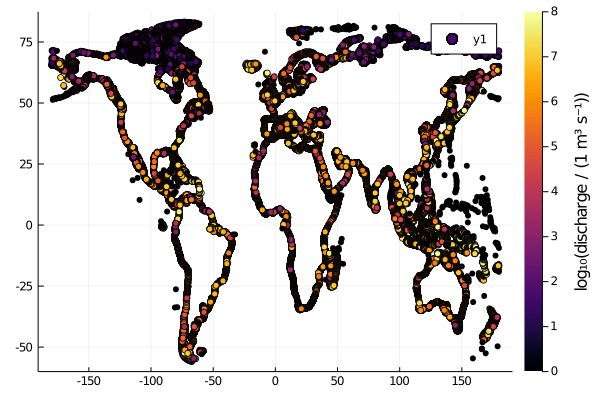

In [6]:
using Plots
scatter([x.lon for x in gws], [x.lat for x in gws],
        zcolor=log10.(ustrip.([x.VFR for x in gws] / u"m^3/s")),
        clim=(0,8), colorbartitle="log₁₀(discharge / (1 m³ s⁻¹))",
        fmt=:png)

We can regrid these into the OCIM2 grid and return the corresponding vector with

In [7]:
gws_grd = ustrip.(u"m^3/s", regrid(gws, grd))

200160-element Array{Float64,1}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

(We convert years to seconds for AIBECS)

We can control the global magnitude of the discharge by chosing a concentration of our tracer in groundwater, $C_\mathsf{gw}$, in mol m⁻³.
For that, we need the volumes of the grid boxes

In [8]:
v = volumevec(grd)

200160-element Array{Float64,1}:
 5.693492696598497e11
 6.267656666812283e11
 6.834351352130837e11
 7.392901411788552e11
 7.942641211123751e11
 8.482915614828765e11
 9.013080767686609e11
 9.532504861865775e11
 1.004056888985702e12
 1.053666738215696e12
 ⋮
 2.7437236229729617e13
 2.6923849140323855e13
 2.83653451428806e13
 2.7917925846214992e13
 2.7437236229729617e13
 2.6923849140323855e13
 2.83653451428806e13
 2.7917925846214992e13
 2.7437236229729617e13

because the source is given by the mass (discharge × concentration) divided by the volume of each box:

In [9]:
function s_gw(p)
    @unpack C_gw = p
    return @. gws_grd * C_gw / v
end

s_gw (generic function with 1 method)

We then write the generic $\boldsymbol{G}$ function, which is

In [10]:
G_gw(x,p) = s_gw(p) - decay(x,p)

G_gw (generic function with 1 method)

##### Parameters

We specify some initial values for the parameters and also include units.

In [11]:
import AIBECS: @units, units
import AIBECS: @initial_value, initial_value
@initial_value @units struct GroundWatersParameters{U} <: AbstractParameters{U}
    τ::U    | 20.0 | u"yr"
    C_gw::U |  1.0 | u"mol/m^3"
end

initial_value (generic function with 31 methods)

Finally, thanks to the initial values we provided, we can instantiate the parameter vector succinctly as

In [12]:
p = GroundWatersParameters()


│ Row │ Symbol │ Value   │ Initial value │ Unit     │
│     │ Symbol │ Float64 │ Float64       │ FreeUni… │
├─────┼────────┼─────────┼───────────────┼──────────┤
│ 1   │ τ      │ 20.0    │ 20.0          │ yr       │
│ 2   │ C_gw   │ 1.0     │ 1.0           │ mol m⁻³  │

We generate the state function `F` and its Jacobian `∇ₓF`,

In [13]:
F, ∇ₓF = state_function_and_Jacobian(T_gw, G_gw)

(AIBECS.var"#F#35"{typeof(Main.##328.T_gw),typeof(Main.##328.G_gw)}(Main.##328.T_gw, Main.##328.G_gw), AIBECS.var"#∇ₓF#37"{typeof(Main.##328.T_gw),AIBECS.var"#∇ₓG#36"{typeof(Main.##328.G_gw)}}(Main.##328.T_gw, AIBECS.var"#∇ₓG#36"{typeof(Main.##328.G_gw)}(Main.##328.G_gw)))

generate the steady-state problem `prob`,

In [14]:
nb = sum(iswet(grd))
x = ones(nb) # initial guess
prob = SteadyStateProblem(F, ∇ₓF, x, p)

SteadyStateProblem with uType Array{Float64,1}
u0: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

and solve it

In [15]:
s = solve(prob, CTKAlg()).u * u"mol/m^3"

200160-element Array{Quantity{Float64,𝐍 𝐋⁻³,Unitful.FreeUnits{(m⁻³, mol),𝐍 𝐋⁻³,nothing}},1}:
 -1.1976569114251033e-7 mol m⁻³
  -1.447973438008902e-7 mol m⁻³
 -1.4879453161968372e-7 mol m⁻³
 -1.5817358327494972e-7 mol m⁻³
  -1.952022620217737e-7 mol m⁻³
 -2.0677685877025737e-7 mol m⁻³
  -2.244366103876224e-7 mol m⁻³
 -4.1123842884193485e-7 mol m⁻³
  -5.599692326820449e-7 mol m⁻³
  -4.425251364361234e-7 mol m⁻³
                              ⋮
   5.356179456771712e-8 mol m⁻³
   9.890403277283724e-8 mol m⁻³
  -1.061571573408199e-7 mol m⁻³
  -3.777197030624626e-8 mol m⁻³
   7.586448212525718e-8 mol m⁻³
  1.8682291679180843e-7 mol m⁻³
  -6.145591682153108e-8 mol m⁻³
  -6.283597352127268e-8 mol m⁻³
   6.068167250823727e-8 mol m⁻³

Let's now run some visualizations using the plot recipes.
Taking a horizontal slice of the 3D field at 200m gives

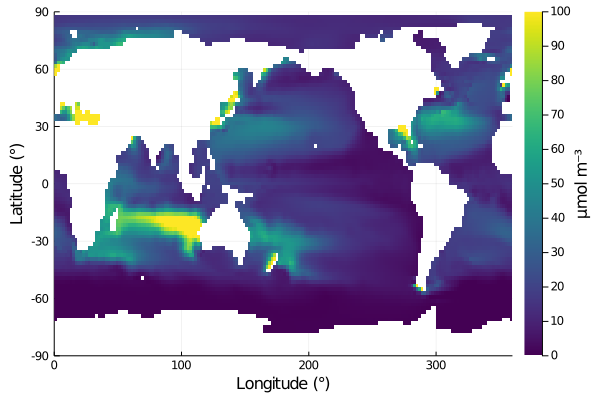

In [16]:
cmap = :viridis
plothorizontalslice(s, grd, zunit=u"μmol/m^3", depth=200, color=cmap, clim=(0,100))

and at 500m:

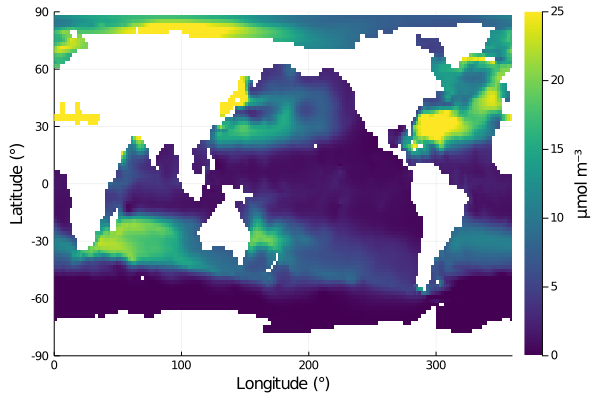

In [17]:
plothorizontalslice(s, grd, zunit=u"μmol/m^3", depth=500, color=cmap, clim=(0,25))

Or we can increase the decay timescale (×10) and decrease the groundwater concentration (÷10) to get a different (more well-mixed) tracer distribution:

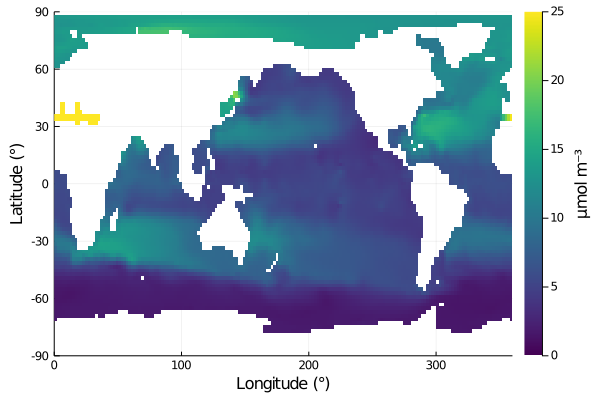

In [18]:
p = GroundWatersParameters(τ = 200.0u"yr", C_gw = 0.1u"mol/m^3")
prob = SteadyStateProblem(F, ∇ₓF, x, p)
s_τ50 = solve(prob, CTKAlg()).u * u"mol/m^3"
plothorizontalslice(s_τ50, grd, zunit=u"μmol/m^3", depth=500, color=cmap, clim=(0,25))

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*